# Test

Some quick tests comparing CanESM5 dcpp-assim runs with GCP2021 observation based SOM-FFN product, as well as the historical free runs.



In [1]:
%matplotlib inline
import xarray as xr
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import nc_time_axis
import xesmf as xe
import wget
import glob
import numpy as np
import warnings
warnings.filterwarnings('ignore') # don't output warnings


- Set up directory paths for the data from the internal network on lxwrk3.

In [2]:
dir_hist = '/misc/cccdata/ra40/data/ESGF_DOWNLOADS/CMIP6/CMIP/CCCma/CanESM5/historical'
dir_dcpp = '/misc/cccdata/ra40/data/ESGF_DOWNLOADS/CMIP6/DCPP/CCCma/CanESM5/dcppA-assim'
dir_ssp245 = '/misc/cccdata/ra40/data/ESGF_DOWNLOADS/CMIP6/ScenarioMIP/CCCma/CanESM5/ssp245'
dir_dcpp_tos = '/misc/cccdata/ra40/data/mcr/DCPP/CCCma/CanESM5/dcppA-assim'
dir_hist_tos = '/misc/cccdata/ra40/data/ESGF_DOWNLOADS/CMIP6/CMIP/CCCma/CanESM5/historical'
dir_ssp245_tos = '/misc/cccdata/ra40/data/ESGF_DOWNLOADS/CMIP6/ScenarioMIP/CCCma/CanESM5/ssp245'


In [3]:
Area = xr.open_dataset('areacello_Ofx_CanESM5_historical_r1i1p2f1_gn.nc')   

- Figuring out which realizations are available for dcpp-assim runs and loading those, as well as the same realizations from historical and ssp245 runs. ssp245 runs are used to append 2015 - 2020 simulations to the historical runs that end at 2015.

In [4]:
realization  = []
for dir in glob.glob(dir_dcpp + '/*'):
    realization.append(dir.split('/')[-1])
    

In [5]:
dcpp_dict = {}
for r in realization:
    path = glob.glob(dir_dcpp + '/' + r + '/Omon/fgco2/gn/v20190429/*nc')
    dslist = [xr.open_dataset(dp) for dp in path ]
    dcpp_dict[r] = xr.concat(dslist, dim = 'time')


hist_dict = {}
for r in realization:
    path = glob.glob(dir_hist + '/' + r + '/Omon/fgco2/gn/v20190429/*nc')
    hist_dict[r] = xr.open_dataset(path[0]).sel(time = slice('1958','2020'))

ssp245_dict = {}
for r in realization:
    path = glob.glob(dir_ssp245 + '/' + r + '/Omon/fgco2/gn/v20190429/*nc')
    ssp245_dict[r] = xr.open_dataset(path[0]).sel(time = slice('1958','2020'))
    
tos_dict_dcpp = {}
for r in realization:
    path = glob.glob(dir_dcpp_tos + '/' + r + '/Omon/tos/gn/v20190429/*nc')
    dslist = [xr.open_dataset(dp) for dp in path ]
    tos_dict_dcpp[r] = xr.concat(dslist, dim = 'time')

tos_dict_hist = {}
for r in realization:
    path = glob.glob(dir_hist_tos + '/' + r + '/Omon/tos/gn/v20190429/*nc')
    tos_dict_hist[r] = xr.open_dataset(path[0]).sel(time = slice('1958','2020'))
    
tos_dict_ssp245 = {}
for r in realization:
    path = glob.glob(dir_ssp245_tos + '/' + r + '/Omon/tos/gn/v20190429/*nc')
    tos_dict_ssp245[r] = xr.open_dataset(path[0]).sel(time = slice('1958','2020'))

In [6]:
dcpp = xr.concat([item.fgco2 for key, item in dcpp_dict.items()], dim = 'member').assign_coords( member = list(dcpp_dict.keys()) )
dcpp_tos = xr.concat([item.tos for key, item in tos_dict_dcpp.items()], dim = 'member').assign_coords( member = list(tos_dict_dcpp.keys()) )
hist = xr.concat([item.fgco2 for key, item in hist_dict.items()], dim = 'member').assign_coords( member = list(hist_dict.keys()) )
ssp245 = xr.concat([item.fgco2 for key, item in ssp245_dict.items()], dim = 'member').assign_coords( member = list(ssp245_dict.keys()) )
hist_tos = xr.concat([item.tos for key, item in tos_dict_hist.items()], dim = 'member').assign_coords( member = list(tos_dict_hist.keys()) )
ssp245_tos = xr.concat([item.tos for key, item in tos_dict_ssp245.items()], dim = 'member').assign_coords( member = list(tos_dict_ssp245.keys()) )

historical  = xr.concat([hist, ssp245], dim = 'time')
historical_tos  = xr.concat([hist_tos, ssp245_tos], dim = 'time')

dcpp = dcpp.drop('depth')
historical = historical.drop('depth')   


In [7]:
del tos_dict_ssp245
del tos_dict_hist
del tos_dict_dcpp
del ssp245_dict
del hist_dict
del dcpp_dict
del hist
del ssp245
del hist_tos
del ssp245_tos

- Regridding to 1--1 normal degree in order to be compareable to GCP2021. 


In [8]:

ds_out = xe.util.grid_global(1, 1)

regridder = xe.Regridder(historical, ds_out, 'bilinear', ignore_degenerate=True,  periodic=True)
historical = regridder(historical)

regridder = xe.Regridder(dcpp, ds_out, 'bilinear',ignore_degenerate=True,  periodic=True)
dcpp = regridder(dcpp)

regridder = xe.Regridder(dcpp_tos, ds_out, 'bilinear',ignore_degenerate=True,  periodic=True)
dcpp_tos = regridder(dcpp_tos)

regridder = xe.Regridder(historical_tos, ds_out, 'bilinear',ignore_degenerate=True,  periodic=True)
historical_tos = regridder(historical_tos)

- Setting up weighs based on cos(lat).

In [9]:
cos_lat_2d = np.cos(np.deg2rad(dcpp['lat'])) * xr.ones_like(dcpp['lon'])
cos_lat_2d

<xarray.DataArray (y: 180, x: 360)>
array([[0.00872654, 0.00872654, 0.00872654, ..., 0.00872654, 0.00872654,
        0.00872654],
       [0.02617695, 0.02617695, 0.02617695, ..., 0.02617695, 0.02617695,
        0.02617695],
       [0.04361939, 0.04361939, 0.04361939, ..., 0.04361939, 0.04361939,
        0.04361939],
       ...,
       [0.04361939, 0.04361939, 0.04361939, ..., 0.04361939, 0.04361939,
        0.04361939],
       [0.02617695, 0.02617695, 0.02617695, ..., 0.02617695, 0.02617695,
        0.02617695],
       [0.00872654, 0.00872654, 0.00872654, ..., 0.00872654, 0.00872654,
        0.00872654]])
Coordinates:
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Dimensions without coordinates: y, x

- Loading GCB2021 and creating the weighs based on cos(lat). The lat, lon coordinates are different on this product compared to model runs. That is why we need another set of weighs which have basically the same values at the same locations but on a different set of coordinates.

In [10]:
# ! wget  https://owncloud.gwdg.de/index.php/s/G61Gmw9gBcBEKKc/download?path=%2Foutput%2Fnetcdf_output&files=MPI_SOM-FFN_GCBv2021_filled.nc

# obs = xr.open_dataset('spco2_1982-2015_MPI_SOM-FFN_v2016.nc', drop_variables='date').fgco2_smoothed
obs = xr.open_dataset('MPI_SOM-FFN_GCBv2021_filled.nc', drop_variables='date').fgco2_smoothed

cos_lat_2d_obs = xr.DataArray(cos_lat_2d.values , dims = ['lat','lon']).assign_coords({'lat' : obs.lat, 'lon' : obs.lon})
obs

<xarray.DataArray 'fgco2_smoothed' (time: 468, lat: 180, lon: 360)>
[30326400 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1982-01-15 1982-02-15 ... 2020-12-15
  * lat      (lat) float32 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float32 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Attributes:
    long_name:      CO2 flux smoothed
    standard_name:  CO2 flux smoothed
    units:          mol/m2/yr
    FillValue:      1e+20

In [11]:
import scipy.io
mat = scipy.io.loadmat('sst_v2021.mat')

ds  = mat['sst'][24:,:,:]


obs_tos = xr.Dataset( data_vars= dict(
    tos =( ['time','lat','lon'],ds)),
     coords=dict(
        lat= (['lat'], obs.lat.values),
        lon= (['lon'], obs.lon.values),
        time=( ['time'],obs.time.values )))
del ds
del mat

### 2000-2020 mean map:

In [13]:
def corr(A,B):

    HIV = A.values.flatten()
    HMV = B.values.flatten()

    HMV = HMV[~np.isnan(HIV)]
    HIV = HIV[~np.isnan(HIV)]
    
    HIV = HIV[~np.isnan(HMV)]
    HMV = HMV[~np.isnan(HMV)]

    return np.corrcoef(HMV,HIV)[0,1]


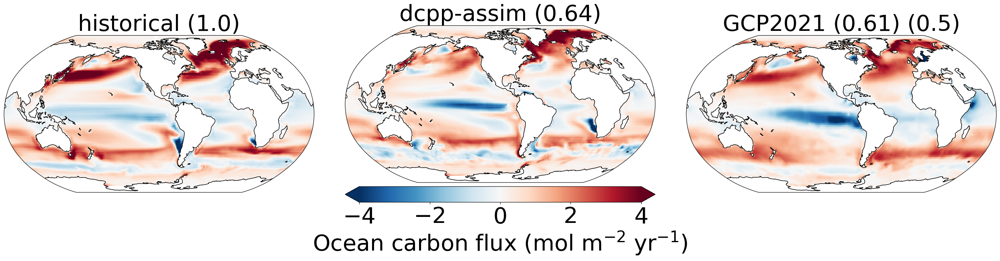

In [22]:
unit_change = 60*60*24*365 * 1000 /12

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig= plt.figure(figsize=(25,15))

# for start, end, idx in [['1990','2000', 1],['2000','2010', 2],['2010','2020',3]]: 
for start, end, idx in [['2000','2020', 1]]: 

    ds = historical.mean('member').sel(time = slice(start, end)).mean('time')*unit_change
    ax = plt.subplot(1,3,idx, projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds.lon, ds.lat, ds, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    cor1 =  np.round(corr(ds,ds),2)
    ax.set_title(f'historical ({cor1})', fontsize=40)
    ax.set_xlabel('2000-2020')
    
    ds1 = dcpp.mean('member').sel(time = slice(start, end)).mean('time')*unit_change
    ax = plt.subplot(1,3,idx+1, projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds1.lon, ds1.lat, ds1, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    divider = make_axes_locatable(ax)
    ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
    cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal", extend = 'both')
    cbar.set_label(label=r'Ocean carbon flux (mol m$^{-2}$ yr$^{-1}$)', size=40)
    cbar.ax.tick_params(labelsize=40)
    cor1 = np.round(corr(ds1, ds),2)
    ax.set_title(f'dcpp-assim ({cor1})', fontsize=40)


    
    ds2 = -1*obs.sel(time = slice(start, end)).mean('time')
    ax = plt.subplot(1,3,idx+2 , projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds2.lon, ds2.lat, ds2, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    cor1 =  np.round(corr(ds2, ds),2)
    cor2 =  np.round(corr(ds2, ds1),2)
    ax.set_title(f'GCP2021 ({cor1}) ({cor2})', fontsize=40)
#     ax2 = ax.twinx()
#     ax2.set_ylabel('2000-2020',rotation=90, fontsize=40)
#     ax2.spines["top"].set_visible(False)
#     ax2.spines["right"].set_visible(False)
#     ax2.spines["left"].set_visible(False)
#     ax2.spines["bottom"].set_visible(False)
#     ax2.get_yaxis().set_ticks([])



    
# ax = plt.subplot(1,3,3)


plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

## pattern correlation and residuals

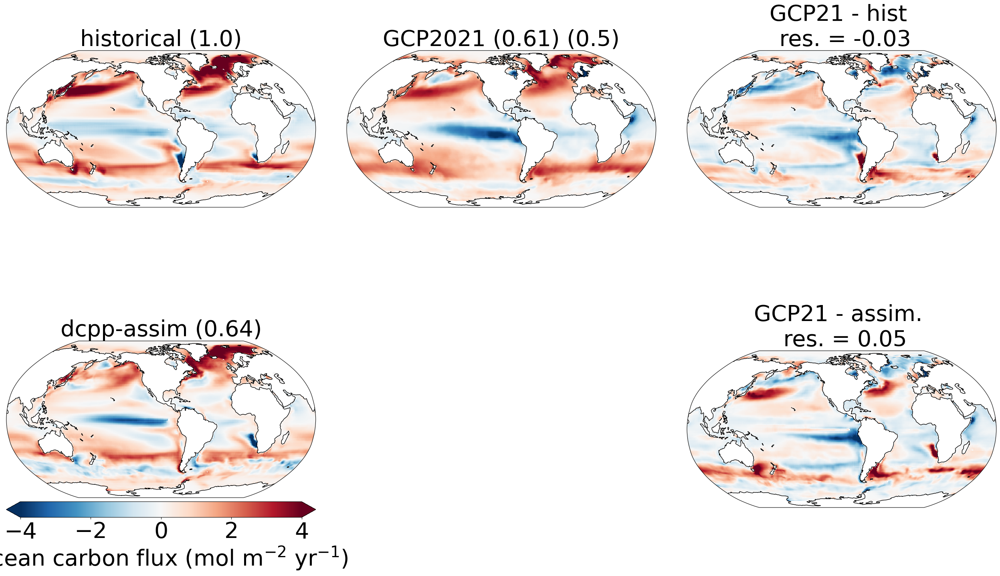

In [41]:
unit_change = 60*60*24*365 * 1000 /12

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig= plt.figure(figsize=(25,15))

# for start, end, idx in [['1990','2000', 1],['2000','2010', 2],['2010','2020',3]]: 
for start, end, idx in [['2000','2020', 1]]: 

    ds = historical.mean('member').sel(time = slice(start, end)).mean('time')*unit_change
    ax = plt.subplot(2,3,1, projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds.lon, ds.lat, ds, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    cor1 =  np.round(corr(ds,ds),2)
    ax.set_title(f'historical ({cor1})', fontsize=40)
    ax.set_xlabel('2000-2020')
    
    ds1 = dcpp.mean('member').sel(time = slice(start, end)).mean('time')*unit_change
    ax = plt.subplot(2,3,4, projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds1.lon, ds1.lat, ds1, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    divider = make_axes_locatable(ax)
    ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
    cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal", extend = 'both')
    cbar.set_label(label=r'Ocean carbon flux (mol m$^{-2}$ yr$^{-1}$)', size=40)
    cbar.ax.tick_params(labelsize=40)
    cor1 = np.round(corr(ds1, ds),2)
    ax.set_title(f'dcpp-assim ({cor1})', fontsize=40)


    
    ds2 = -1*obs.sel(time = slice(start, end)).mean('time')
    ax = plt.subplot(2,3, 2 , projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(ds2.lon, ds2.lat, ds2, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    cor1 =  np.round(corr(ds2, ds),2)
    cor2 =  np.round(corr(ds2, ds1),2)
    ax.set_title(f'GCP2021 ({cor1}) ({cor2})', fontsize=40)
#     ax2 = ax.twinx()
#     ax2.set_ylabel('2000-2020',rotation=90, fontsize=40)
#     ax2.spines["top"].set_visible(False)
#     ax2.spines["right"].set_visible(False)
#     ax2.spines["left"].set_visible(False)
#     ax2.spines["bottom"].set_visible(False)
#     ax2.get_yaxis().set_ticks([])

    ds = xr. DataArray(ds.values, dims = ['lat', 'lon']).assign_coords({'lat': ds2.lat, 'lon': ds2.lon })
    ds1 = xr. DataArray(ds1.values, dims = ['lat', 'lon']).assign_coords({'lat': ds2.lat, 'lon': ds2.lon })
    d = ds2 - ds
    ax = plt.subplot(2,3, 3 , projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(d.lon, d.lat, d, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    res = (d*cos_lat_2d_obs).sum(['lat', 'lon'])/cos_lat_2d_obs.sum(['lat', 'lon'])
    ax.set_title(f'GCP21 - hist \n res. = {np.round(res.values,2)}', fontsize=40)

    
    d = ds2 - ds1
    ax = plt.subplot(2,3, 6 , projection=ccrs.Robinson(central_longitude=260))
    cb= ax.pcolormesh(d.lon, d.lat, d, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 4,vmin= -4,rasterized=True,transform=ccrs.PlateCarree())
    _=ax.coastlines()
    res = (d*cos_lat_2d_obs).sum(['lat', 'lon'])/cos_lat_2d_obs.sum(['lat', 'lon'])
    ax.set_title(f'GCP21 - assim. \n res. = {np.round(res.values,2)}', fontsize=40)
#     ax2 = ax.twinx()
#     ax2.set_ylabel(f'residual = {np.round(res.values,2)} ',rotation=90, fontsize=40)
#     ax2.spines["top"].set_visible(False)
#     ax2.spines["right"].set_visible(False)
#     ax2.spines["left"].set_visible(False)
#     ax2.spines["bottom"].set_visible(False)
#     ax2.get_yaxis().set_ticks([])
    
# ax = plt.subplot(1,3,3)


plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

## pattern correlation and residuals

The first number is pattern correlation with the historical run and the second number is with the assimilation run.

### Point correlation maps:

/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

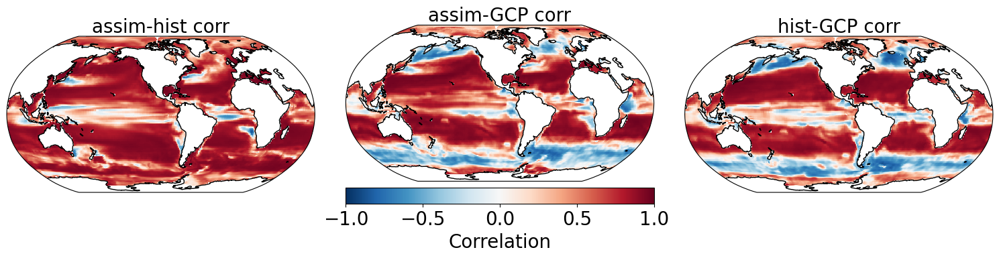

In [29]:
dcpp_like = xr. DataArray(dcpp.mean('member').values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : dcpp.time, 'lat': obs.lat, 'lon': obs.lon })
hist_like = xr. DataArray(historical.mean('member').values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : historical.time, 'lat': obs.lat, 'lon': obs.lon })

obs['time'] = dcpp.sel(time  =slice('1982','2020'))['time']
dcpp_his = xr.corr(dcpp.mean('member').sel(time  =slice('1982','2020'))*unit_change, historical.mean('member').sel(time  =slice('1982','2020'))*unit_change , dim = 'time')
dcpp_gcp = xr.corr(dcpp_like.sel(time  =slice('1982','2020'))*unit_change, -1*obs.sel(time  =slice('1982','2020')) , dim = 'time')
his_gcp = xr.corr(hist_like.sel(time  =slice('1982','2020'))*unit_change, -1*obs.sel(time  =slice('1982','2020')) , dim = 'time')

plt.figure(figsize = (15,10))

ax = plt.subplot(1,3,1 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-hist corr', fontsize=20, pad = 0.5)


ax = plt.subplot(1,3,2 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-GCP corr', fontsize=20, pad = 0.5)
divider = make_axes_locatable(ax)
ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal")
cbar.set_label(label=r'Correlation', size=20)
cbar.ax.tick_params(labelsize=20)
    
ax = plt.subplot(1,3,3 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'hist-GCP corr', fontsize=20, pad = 0.5)    


plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

### Area-weighed global mean time-series:


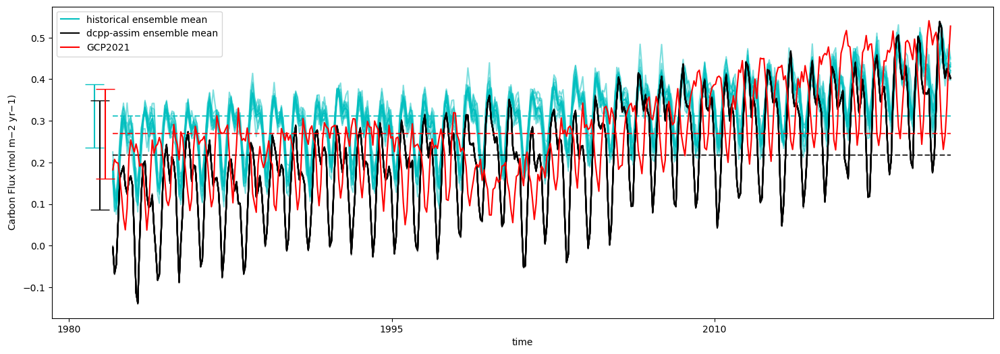

In [90]:
unit_change = 60*60*24*365 * 1000 /12
plt.figure(figsize = (18,6))

for rl in range(10):
    ds = ((historical[rl,:,:,:]*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
    ds.sel(time  =slice('1982','2020')).plot(color = 'c', alpha = 0.5)
    
ds = ((historical.mean('member')*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ds.sel(time  =slice('1982','2020')).plot(color = 'c', label = 'historical ensemble mean')
ref = ds.sel(time  =slice('1982','2020')).mean('time')
mean = ref * xr.ones_like(ds.sel(time  =slice('1982','2020')))
mean.plot(linestyle = 'dashed', color = 'c', alpha = 0.8)
var = (ds.sel(time  =slice('1982','2020')) - ref).std('time')
plt.errorbar(ds['time'][278], ref, yerr =  var, ecolor='c',capsize=10)


for rl in range(10):
    ds = ((dcpp[rl,:,:,:]*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
    ds.sel(time  =slice('1982','2020')).plot(color = 'k', alpha = 0.5)
    
ds = ((dcpp.mean('member')*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ds.sel(time  =slice('1982','2020')).plot(color = 'k', label = 'dcpp-assim ensemble mean')
ref = ds.sel(time  =slice('1982','2020')).mean('time')
mean = ref * xr.ones_like(ds.sel(time  =slice('1982','2020')))
mean.plot(linestyle = 'dashed', color = 'k', alpha = 0.8)
var = (ds.sel(time  =slice('1982','2020')) - ref).std('time')
plt.errorbar(ds['time'][281],ref,yerr =  var, ecolor='k',capsize=10)

ds1 = ((-1*obs*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))
ds1['time'] = ds.sel(time  =slice('1982','2020'))['time']
ds1.sel(time  =slice('1982','2020')).plot(color = 'r', label = 'GCP2021')
ref = ds1.sel(time  =slice('1982','2020')).mean('time')
mean = ref * xr.ones_like(ds1.sel(time  =slice('1982','2020')))
mean.plot(linestyle = 'dashed', color = 'r', alpha = 0.8)
var = (ds1.sel(time  =slice('1982','2020')) - ref).std('time')
plt.errorbar(ds['time'][284],ref,yerr =  var, ecolor='r',capsize=10)

plt.ylabel('Carbon Flux (mol m${-2}$ yr${-1}$)')
plt.xlabel('time')
plt.legend()


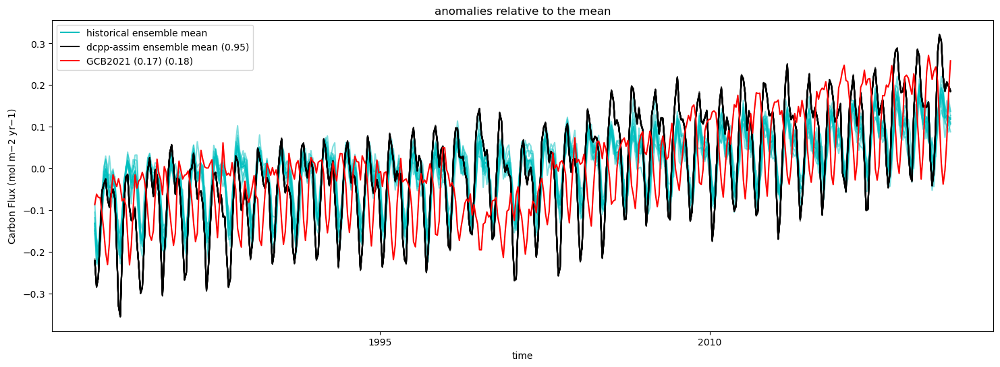

In [82]:
unit_change = 60*60*24*365 * 1000 /12
plt.figure(figsize = (18,6))

for rl in range(10):

    ds = ((historical[rl,:,:,:]*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
    ref = ds.sel(time  =slice('1982','2020')).mean('time')
    (ds.sel(time  =slice('1982','2020'))  -ref).plot(color = 'c', alpha = 0.5)
    
ds = ((historical.mean('member')*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ref = ds.sel(time  =slice('1982','2020')).mean('time')
(ds.sel(time  =slice('1982','2020'))  -ref).plot(color = 'c', label = 'historical ensemble mean')

for rl in range(10):
    ds1 = ((dcpp[rl,:,:,:]*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
    ref = ds1.sel(time  =slice('1982','2020')).mean('time')
    (ds1.sel(time  =slice('1982','2020'))  -ref).plot(color = 'k', alpha = 0.5)
    
ds1 = ((dcpp.mean('member')*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ref = ds1.sel(time  =slice('1982','2020')).mean('time')
cor1 = xr.corr(ds1, ds, dim = 'time').values
(ds1.sel(time  =slice('1982','2020'))  -ref).plot(color = 'k', label = f'dcpp-assim ensemble mean ({np.round(cor1,2)})')



ds2 = ((-1*obs*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))
ds2['time'] = ds.sel(time  =slice('1982','2020'))['time']
ref = ds2.sel(time  =slice('1982','2020')).mean('time')
cor1 = xr.corr(ds2, ds, dim = 'time').values
cor2 = xr.corr(ds2, ds1, dim = 'time').values
(ds2.sel(time  =slice('1982','2020'))-ref).plot(color = 'r', label = f'GCB2021 ({np.round(cor1,2)}) ({np.round(cor2,2)})')


plt.ylabel('Carbon Flux (mol m${-2}$ yr${-1}$)')
plt.xlabel('time')
plt.title('anomalies relative to the mean')
plt.legend()

## Signal decomposition

The signal is broken down to seasonal and decadal components. First, a unique point-wise trend is removed from each dataset. Then, a repeating seasonal cycle was calculated and the decadal component was filtered out of the detrended deseasonalized component.


In [16]:
def poli(data):
  ds = data.copy()
  time = np.arange(1982,2021,1/12)
  T = ds['time']
  ds['time'] = time
  m = ds.polyfit( dim  = 'time', deg = 1).polyfit_coefficients
  
  out = m[0]*ds.time +  m[1]
  out['time'] = T
  del ds
  del T
  return m[0], out


In [17]:
hist_det = historical.mean('member').sel(time  =slice('1982','2020')) - poli(historical.mean('member').sel(time  =slice('1982','2020')))[1]
dcpp_det = dcpp.mean('member').sel(time  =slice('1982','2020')) - poli(dcpp.mean('member').sel(time  =slice('1982','2020')))[1]
obs_det = -1*obs - poli(-1*obs)[1]
dcpp_tos_det = dcpp_tos.mean('member').sel(time  =slice('1982','2020')) - poli(dcpp_tos.mean('member').sel(time  =slice('1982','2020')))[1]
hist_tos_det = historical_tos.mean('member').sel(time  =slice('1982','2020')) - poli(historical_tos.mean('member').sel(time  =slice('1982','2020')))[1]
obs_tos_det = obs_tos.tos - poli(obs_tos.tos)[1]


hist_season = hist_det.groupby('time.month').mean()
dcpp_season = dcpp_det.groupby('time.month').mean()
obs_season = obs_det.groupby('time.month').mean()
dcpp_tos_season = dcpp_tos_det.groupby('time.month').mean()
hist_tos_season = hist_tos_det.groupby('time.month').mean()
obs_tos_season = obs_tos_det.groupby('time.month').mean()


hist_des = hist_det.groupby('time.month') - hist_season
dcpp_des = dcpp_det.groupby('time.month') - dcpp_season
obs_des = obs_det.groupby('time.month') - obs_season

### Area-weighed global mean timeseries

In [19]:
# run the code from the last section for the decadal component or load them directly here.
hist_decadal = xr.load_dataset('hist_decadal.nc').__xarray_dataarray_variable__
dcpp_decadal = xr.load_dataset('dcpp_decadal.nc').__xarray_dataarray_variable__
obs_decadal = xr.load_dataset('obs_decadal.nc').__xarray_dataarray_variable__

biome = xr.open_dataset('Time_Varying_Biomes.nc').MeanBiomes
BIO = ['North Pacific Ice',
'North Pacific Subpolar Seasonally Stratified',
'North Pacific Subtropical Seasonally Stratified',
 'North Pacific Subtropical Permanently Stratified',
'West Pacific Equatorial',
'East Pacific Equatorial',
'South Pacific Subtropical Permanently Stratified',
'(Omitted) North Atlantic Ice',
'North Atlantic Subpolar Seasonally Stratified',
'North Atlantic Subtropical Seasonally Stratified',
'North Atlantic Subtropical Permanently Stratified',
'Atlantic Equatorial',
'South Atlantic Subtropical Permanently Stratified',
'Indian Ocean Subtropical Permanently Stratified',
'Southern Ocean Subtropical Seasonally Stratified',
'Southern Ocean Subpolar Seasonally Stratified',
'Southern Ocean Ice']


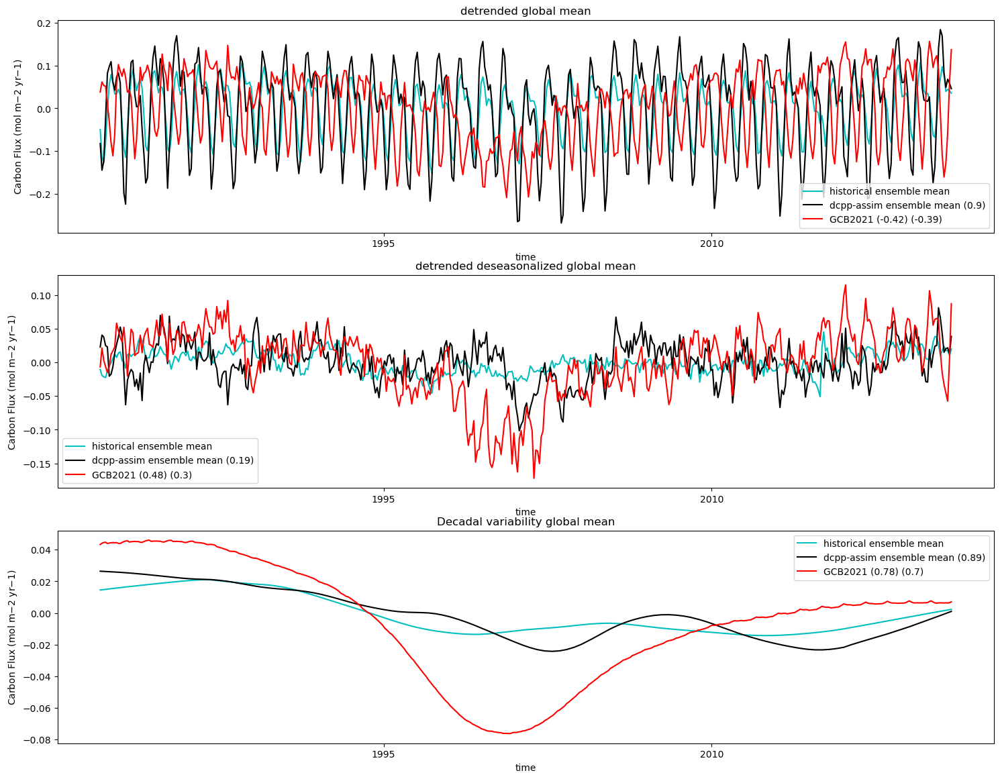

In [20]:
unit_change = 60*60*24*365 * 1000 /12
plt.figure(figsize = (18,14))

plt.subplot(3,1,1)

ds = ((hist_det*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ds.plot(color = 'c', label = 'historical ensemble mean ')

    
ds1 = ((dcpp_det*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
cor1 = xr.corr(ds1, ds, dim = 'time').values
ds1.plot(color = 'k', label = f'dcpp-assim ensemble mean ({np.round(cor1,2)})')


ds2 = ((obs_det*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))
ds2['time'] = ds['time'] #both datasets should have same time coordinates for corr to work.
cor1 = xr.corr(ds2, ds, dim = 'time').values
cor2 = xr.corr(ds2, ds1, dim = 'time').values
ds2.plot(color = 'r', label = f'GCB2021 ({np.round(cor1,2)}) ({np.round(cor2,2)})')

plt.ylabel('Carbon Flux (mol m${-2}$ yr${-1}$)')
plt.xlabel('time')
plt.title('detrended global mean')
plt.legend()


plt.subplot(3,1,2)

ds = ((hist_des*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
ds.plot(color = 'c', label = 'historical ensemble mean ')

    
ds1 = ((dcpp_des*cos_lat_2d).sum(['x','y'])/cos_lat_2d.sum(['x','y']))*unit_change
cor1 = xr.corr(ds1, ds, dim = 'time').values
ds1.plot(color = 'k', label = f'dcpp-assim ensemble mean ({np.round(cor1,2)})')


ds2 = ((obs_des*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))
ds2['time'] = ds['time']
cor1 = xr.corr(ds2, ds, dim = 'time').values
cor2 = xr.corr(ds2, ds1, dim = 'time').values
ds2.plot(color = 'r', label = f'GCB2021 ({np.round(cor1,2)}) ({np.round(cor2,2)})')

plt.ylabel('Carbon Flux (mol m${-2}$ yr${-1}$)')
plt.xlabel('time')
plt.title('detrended deseasonalized global mean')
plt.legend()


plt.subplot(3,1,3)


ds = ((hist_decadal*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))*unit_change
ds.plot(color = 'c', label = 'historical ensemble mean ')

    
ds1 = ((dcpp_decadal*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))*unit_change
cor1 = xr.corr(ds1, ds, dim = 'time').values
ds1.plot(color = 'k', label = f'dcpp-assim ensemble mean ({np.round(cor1,2)})')


ds2 = ((obs_decadal*cos_lat_2d_obs).sum(['lat','lon'])/cos_lat_2d_obs.sum(['lat','lon']))
ds2['time'] = ds['time']
cor1 = xr.corr(ds2, ds, dim = 'time').values
cor2 = xr.corr(ds2, ds1, dim = 'time').values
ds2.plot(color = 'r', label = f'GCB2021 ({np.round(cor1,2)}) ({np.round(cor2,2)})')

plt.ylabel('Carbon Flux (mol m${-2}$ yr${-1}$)')
plt.xlabel('time')
plt.title('Decadal variability global mean')


plt.legend()

In [62]:
biome_model = xr.DataArray(biome.values, dims = ['x','y']).assign_coords({'lon': dcpp.lon, 'lat': dcpp.lat}).transpose()

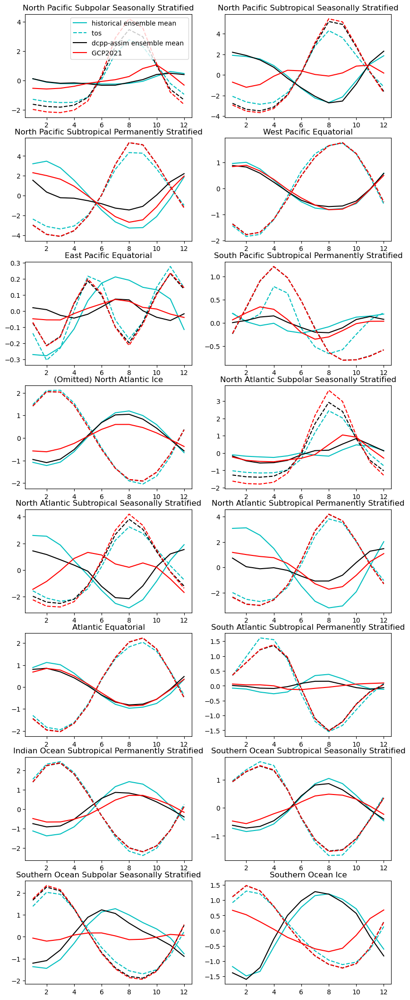

In [76]:
plt.figure(figsize = (10,30))

for i in range(17):
    
    if i == 0:
        pass
    else:
        
        plt.subplot(9,2,i)


        ds = ((hist_season.where(biome_model == i)*cos_lat_2d.where(biome_model == i)).sum(['x','y'])/cos_lat_2d.where(biome_model == i).sum(['x','y']))*unit_change
        ds.plot(color = 'c', label = 'historical ensemble mean ')

        ds = ((hist_tos_season.where(biome_model == i)*cos_lat_2d.where(biome_model == i)).sum(['x','y'])/cos_lat_2d.where(biome_model == i).sum(['x','y']))
        ds.plot(color = 'c', linestyle = 'dashed' , label = 'tos ')


        ds = ((dcpp_season.where(biome_model == i)*cos_lat_2d.where(biome_model == i)).sum(['x','y'])/cos_lat_2d.where(biome_model == i).sum(['x','y']))*unit_change
        ds.plot(color = 'k', label = 'dcpp-assim ensemble mean ')

        ds = ((dcpp_tos_season.where(biome_model == i)*cos_lat_2d.where(biome_model == i)).sum(['x','y'])/cos_lat_2d.where(biome_model == i).sum(['x','y']))
        ds.plot(color = 'k', linestyle = 'dashed')


        ds = ((obs_season.where(biome == i)*cos_lat_2d_obs.where(biome == i)).sum(['lat','lon'])/cos_lat_2d_obs.where(biome == i).sum(['lat','lon']))
        ds.plot(color = 'r', label = 'GCP2021 ')

        ds = ((obs_tos_season.where(biome == i)*cos_lat_2d_obs.where(biome == i)).sum(['lat','lon'])/cos_lat_2d_obs.where(biome == i).sum(['lat','lon']))
        ds.plot(color = 'r', linestyle = 'dashed')
        plt.title(f'{BIO[i]}')
        plt.xlabel('')
        if i == 1:
            plt.legend()



### Point-wise correlations

/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

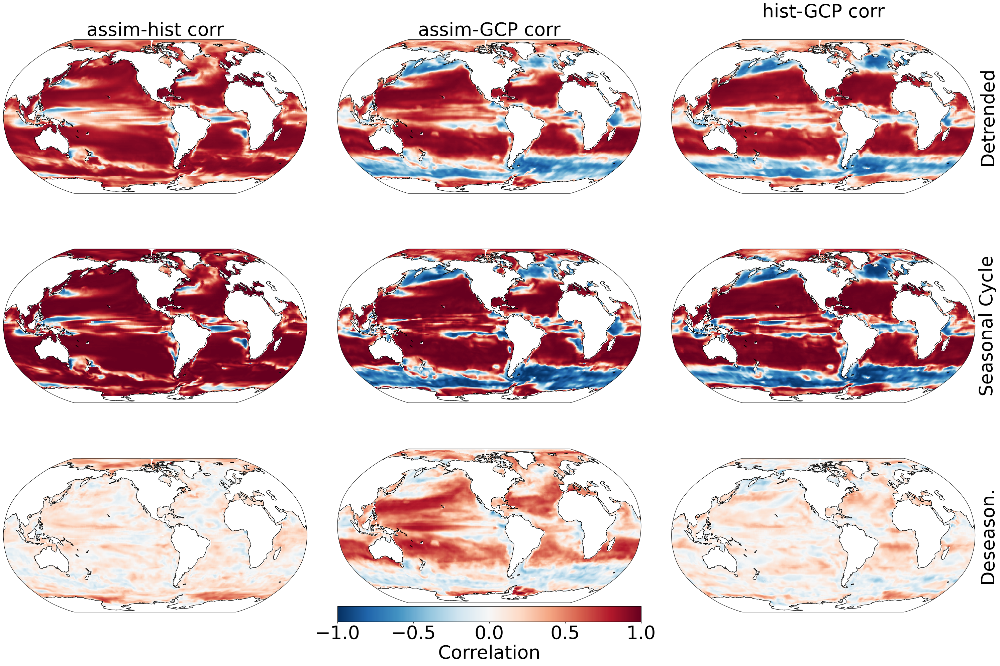

In [74]:
plt.figure(figsize = (30,20))

dcpp_det_like = xr. DataArray(dcpp_det.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : dcpp_det.time, 'lat': obs.lat, 'lon': obs.lon })
hist_det_like = xr. DataArray(hist_det.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : hist_det.time, 'lat': obs.lat, 'lon': obs.lon })

obs_det['time'] = dcpp_det['time']
dcpp_his = xr.corr(dcpp_det*unit_change, hist_det*unit_change , dim = 'time')
dcpp_gcp = xr.corr(dcpp_det_like*unit_change, obs_det , dim = 'time')
his_gcp = xr.corr(hist_det_like*unit_change, obs_det , dim = 'time')


ax = plt.subplot(3,3,1 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-hist corr', fontsize=40, pad = 0.5)


ax = plt.subplot(3,3,2 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-GCP corr', fontsize=40, pad = 0.5)

ax = plt.subplot(3,3,3 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'hist-GCP corr', fontsize=40, pad = 0.5)    
ax2 = ax.twinx()
ax2.set_ylabel('Detrended',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])

####


dcpp_season_like = xr. DataArray(dcpp_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : dcpp_season.month, 'lat': obs.lat, 'lon': obs.lon })
hist_season_like = xr. DataArray(hist_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : hist_season.month, 'lat': obs.lat, 'lon': obs.lon })


dcpp_his = xr.corr(dcpp_season*unit_change, hist_season*unit_change , dim = 'month')
dcpp_gcp = xr.corr(dcpp_season_like*unit_change, obs_season , dim = 'month')
his_gcp = xr.corr(hist_season_like*unit_change, obs_season , dim = 'month')



ax = plt.subplot(3,3,4 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()


ax = plt.subplot(3,3,5 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()

    
ax = plt.subplot(3,3,6 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax2 = ax.twinx()
ax2.set_ylabel('Seasonal Cycle',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])
####   detrended deseasonalized

dcpp_des_like = xr. DataArray(dcpp_des.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : dcpp_des.time, 'lat': obs.lat, 'lon': obs.lon })
hist_des_like = xr. DataArray(hist_des.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : hist_des.time, 'lat': obs.lat, 'lon': obs.lon })

obs_des['time'] = dcpp_des['time']
dcpp_his = xr.corr(dcpp_des*unit_change, hist_des*unit_change , dim = 'time')
dcpp_gcp = xr.corr(dcpp_des_like*unit_change, obs_des , dim = 'time')
his_gcp = xr.corr(hist_des_like*unit_change, obs_des , dim = 'time')


ax = plt.subplot(3,3,7 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()


ax = plt.subplot(3,3,8 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
divider = make_axes_locatable(ax)
ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal")
cbar.set_label(label=r'Correlation', size=40)
cbar.ax.tick_params(labelsize=40)
    
ax = plt.subplot(3,3,9 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax2 = ax.twinx()
ax2.set_ylabel('Deseason.',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])

plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

<Figure size 500x1500 with 0 Axes>

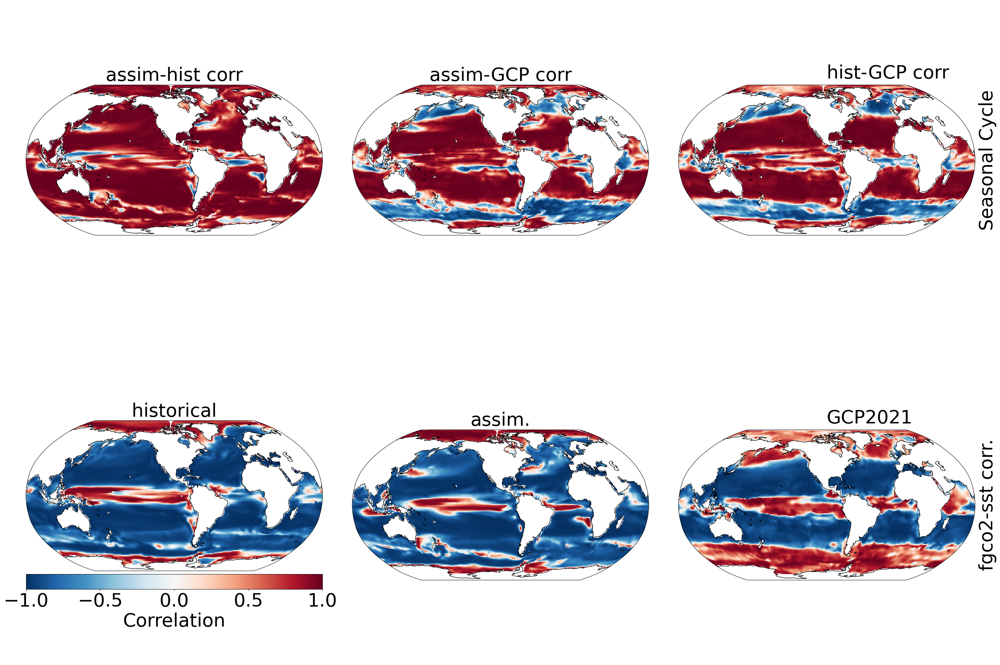

In [33]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig= plt.figure(figsize=(5,15))


plt.figure(figsize = (30,20))
unit_change = 60*60*24*365 * 1000 /12

dcpp_season_like = xr. DataArray(dcpp_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : dcpp_season.month, 'lat': obs.lat, 'lon': obs.lon })
hist_season_like = xr. DataArray(hist_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : hist_season.month, 'lat': obs.lat, 'lon': obs.lon })


dcpp_his = xr.corr(dcpp_season*unit_change, hist_season*unit_change , dim = 'month')
dcpp_gcp = xr.corr(dcpp_season_like*unit_change, obs_season , dim = 'month')
his_gcp = xr.corr(hist_season_like*unit_change, obs_season , dim = 'month')



ax = plt.subplot(2,3,1 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-hist corr', fontsize=40, pad = 0.5)



ax = plt.subplot(2,3,2 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-GCP corr', fontsize=40, pad = 0.5)

    
ax = plt.subplot(2,3,3 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax2 = ax.twinx()
ax2.set_ylabel('Seasonal Cycle',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])
# ax.set_title(f'hist-GCP corr', fontsize=40, pad = 0.5)
plt.text(0,0.76, 'hist-GCP corr', fontsize=40)
dcpp_f_t = xr.corr(dcpp_season*unit_change, dcpp_tos_season , dim = 'month')
gcp_f_t = xr.corr(obs_season, obs_tos_season , dim = 'month')
historical_f_t = xr.corr(hist_season, hist_tos_season , dim = 'month')


ax = plt.subplot(2,3,4 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(historical_f_t.lon, historical_f_t.lat, historical_f_t, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'historical', fontsize=40, pad = 0.5)
divider = make_axes_locatable(ax)
ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal")
cbar.set_label(label=r'Correlation', size=40)
cbar.ax.tick_params(labelsize=40)


ax = plt.subplot(2,3,5 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_f_t.lon, dcpp_f_t.lat, dcpp_f_t, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim.', fontsize=40, pad = 0.5)

ax = plt.subplot(2,3,6 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(gcp_f_t.lon, gcp_f_t.lat, gcp_f_t, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
# ax.set_title(f'GCP2021', fontsize=40, pad = -5)
ax2 = ax.twinx()
ax2.set_ylabel('fgco2-sst corr.',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])
plt.text(0.5,0.76, 'GCP2021', fontsize=40)

plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/acrnrpg/anaconda3/envs/dcpp/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

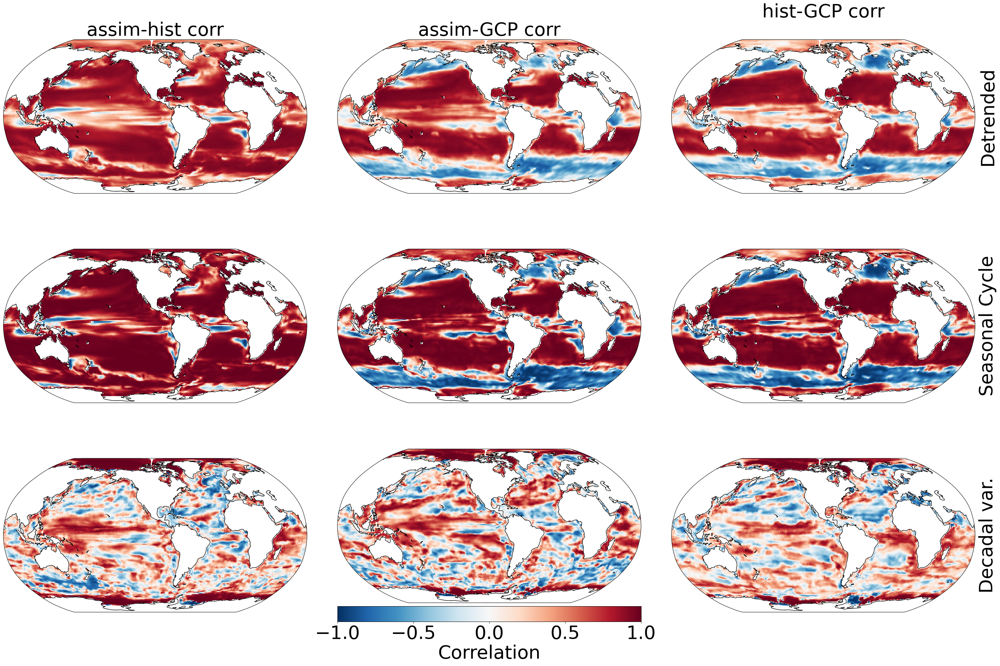

In [65]:
plt.figure(figsize = (30,20))

dcpp_det_like = xr. DataArray(dcpp_det.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : dcpp_det.time, 'lat': obs.lat, 'lon': obs.lon })
hist_det_like = xr. DataArray(hist_det.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : hist_det.time, 'lat': obs.lat, 'lon': obs.lon })

obs_det['time'] = dcpp_det['time']
dcpp_his = xr.corr(dcpp_det*unit_change, hist_det*unit_change , dim = 'time')
dcpp_gcp = xr.corr(dcpp_det_like*unit_change, obs_det , dim = 'time')
his_gcp = xr.corr(hist_det_like*unit_change, obs_det , dim = 'time')


ax = plt.subplot(3,3,1 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-hist corr', fontsize=40, pad = 0.5)


ax = plt.subplot(3,3,2 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'assim-GCP corr', fontsize=40, pad = 0.5)

ax = plt.subplot(3,3,3 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax.set_title(f'hist-GCP corr', fontsize=40, pad = 0.5)    
ax2 = ax.twinx()
ax2.set_ylabel('Detrended',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])

####


dcpp_season_like = xr. DataArray(dcpp_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : dcpp_season.month, 'lat': obs.lat, 'lon': obs.lon })
hist_season_like = xr. DataArray(hist_season.values, dims = ['month', 'lat', 'lon']).assign_coords({'month' : hist_season.month, 'lat': obs.lat, 'lon': obs.lon })


dcpp_his = xr.corr(dcpp_season*unit_change, hist_season*unit_change , dim = 'month')
dcpp_gcp = xr.corr(dcpp_season_like*unit_change, obs_season , dim = 'month')
his_gcp = xr.corr(hist_season_like*unit_change, obs_season , dim = 'month')



ax = plt.subplot(3,3,4 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()


ax = plt.subplot(3,3,5 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()

    
ax = plt.subplot(3,3,6 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax2 = ax.twinx()
ax2.set_ylabel('Seasonal Cycle',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])
####   detrended deseasonalized

# dcpp_des_like = xr. DataArray(dcpp_des.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : dcpp_des.time, 'lat': obs.lat, 'lon': obs.lon })
# hist_des_like = xr. DataArray(hist_des.values, dims = ['time', 'lat', 'lon']).assign_coords({'time' : hist_des.time, 'lat': obs.lat, 'lon': obs.lon })

# obs_des['time'] = dcpp_des['time']
# dcpp_his = xr.corr(dcpp_des*unit_change, hist_des*unit_change , dim = 'time')
# dcpp_gcp = xr.corr(dcpp_des_like*unit_change, obs_des , dim = 'time')
# his_gcp = xr.corr(hist_des_like*unit_change, obs_des , dim = 'time')


# ax = plt.subplot(3,3,7 , projection=ccrs.Robinson(central_longitude=260))
# cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
# _=ax.coastlines()


# ax = plt.subplot(3,3,8 , projection=ccrs.Robinson(central_longitude=260))
# cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
# _=ax.coastlines()
# divider = make_axes_locatable(ax)
# ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
# cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal")
# cbar.set_label(label=r'Correlation', size=40)
# cbar.ax.tick_params(labelsize=40)
    
# ax = plt.subplot(3,3,9 , projection=ccrs.Robinson(central_longitude=260))
# cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
# _=ax.coastlines()
# ax2 = ax.twinx()
# ax2.set_ylabel('Deseason.',rotation=90, fontsize=40)
# ax2.spines["top"].set_visible(False)
# ax2.spines["right"].set_visible(False)
# ax2.spines["left"].set_visible(False)
# ax2.spines["bottom"].set_visible(False)
# ax2.get_yaxis().set_ticks([])


####   Decadal Variability


dcpp_his = xr.corr(dcpp_decadal*unit_change, hist_decadal*unit_change , dim = 'time')
dcpp_gcp = xr.corr(dcpp_decadal*unit_change, obs_decadal , dim = 'time')
his_gcp = xr.corr(hist_decadal*unit_change, obs_decadal , dim = 'time')


ax = plt.subplot(3,3,7 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_his.lon, dcpp_his.lat, dcpp_his, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()


ax = plt.subplot(3,3,8 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(dcpp_gcp.lon, dcpp_gcp.lat, dcpp_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
divider = make_axes_locatable(ax)
ax_cb = divider.append_axes('bottom', size="10%", pad=0.1, axes_class=plt.Axes)
cbar=plt.colorbar(cb, cax=ax_cb, orientation="horizontal")
cbar.set_label(label=r'Correlation', size=40)
cbar.ax.tick_params(labelsize=40)
    
ax = plt.subplot(3,3,9 , projection=ccrs.Robinson(central_longitude=260))
cb= ax.pcolormesh(his_gcp.lon, his_gcp.lat, his_gcp, cmap=plt.cm.get_cmap('RdBu_r'),vmax = 1,vmin= -1,rasterized=True,transform=ccrs.PlateCarree())
_=ax.coastlines()
ax2 = ax.twinx()
ax2.set_ylabel('Decadal var.',rotation=90, fontsize=40)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.spines["left"].set_visible(False)
ax2.spines["bottom"].set_visible(False)
ax2.get_yaxis().set_ticks([])


plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.1)

## Filtering the decadal component of variability

The decadal variability component is filtered out of the detrended deseasonalized component using a Locally Weighted Scatterplot Smoothing (LOWESS) following Gloege et al. (2020).

In [56]:
! conda install -c conda-forge statsmodels --y
# ! conda install -c teamcore rstl --y


Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 22.9.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/acrnrpg/anaconda3/envs/dcpp

  added / updated specs:
    - statsmodels


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    patsy-0.5.3                |     pyhd8ed1ab_0         189 KB  conda-forge
    statsmodels-0.13.5         |   py39h2ae25f5_2        11.2 MB  conda-forge
    ------------------------------------------------------------
                                           Total:        11.3 MB

The following NEW packages will be INSTALLED:

  patsy              conda-forge/noarch::patsy-0.5.3-pyhd8ed1ab_0 None
  statsmodels        conda-forge/linux-64::statsmodels-0.13.5-py39h2ae25f5_2 None



patsy-0.5.3          | 189 KB  

In [57]:

### Gloege et al. 2021

import pandas as pd
from pandas.core.nanops import nanmean as pd_nanmean
import scipy
from scipy import stats
import statsmodels.nonparametric.smoothers_lowess
# from rstl import STL as RSTL

def _lowess_ufunc(data, lo_pts=None, lo_delta=None, it=None):
    '''
    _lowess(data, lo_pts=None, lo_delta=None)
    
    LOWESS (Locally Weighted Scatterplot Smoothing)
    A lowess function that outs smoothed estimates of endog
    at the given exog values from points (exog, endog)
    Parameters
    ----------
    data: 1-D numpy array
        The y-values of the observed points
    lo_pts: float
        Between 0 and 1. The fraction of the data used
        when estimating each y-value.
    lo_delta: float
        Distance within which to use linear-interpolation
        instead of weighted regression.
    Returns
    -------
    out: ndarray, float
        The returned array is two-dimensional if return_sorted is True, and
        one dimensional if return_sorted is False.
        If return_sorted is True, then a numpy array with two columns. The
        first column contains the sorted x (exog) values and the second column
        the associated estimated y (endog) values.
        If return_sorted is False, then only the fitted values are returned,
        and the observations will be in the same order as the input arrays.
    References
    ----------
    Cleveland, W.S. (1979) "Robust Locally Weighted Regression
    and Smoothing Scatterplots". Journal of the American Statistical
    Association 74 (368): 829-836.
    '''
    # https://github.com/joaofig/pyloess another way
    ### Define lowess smoother
    lowess = statsmodels.nonparametric.smoothers_lowess.lowess
    
    ### If importing an xr.DataArray make numpy array
    if (type(data)==type(xr.DataArray([]))):
        data = data.values
        
    ### This adds an extra dimension if 1D
    ### Turns DataArray into numpy array
    if (len(data.shape)==1):
        data = np.expand_dims(data, axis=1)
        
    ### Get dimensions
    ndim0 = np.shape(data)[0]
    ndim1 = np.shape(data)[1]

    ### Allocate space to store data
    data_dt = np.ones((ndim0, ndim1))*np.NaN
    #slope = np.ones((ndim1))*np.NaN
    #intercept = np.ones((ndim1))*np.NaN

    ### Loop over the stacked dimension
    #for dim1 in tqdm(range(ndim1)):
    for dim1 in range(ndim1):  
        ### Mask is true if not a NaN
        mask = ~np.isnan(data[:, dim1])
        
        ### If the mask is all false
        ### We will skip that point
        if np.sum(mask)!=0:
            ### apply smoother with parameters 
            trend = lowess(data[:,dim1], 
                    np.array([x for x in range(len(data[:,dim1]))], dtype=np.float64),
                    frac=lo_pts / len(data[:,dim1]),
                    delta=lo_delta * len(data[:,dim1]),
                    it=it)
            
            ### subtract linear trend
            data_dt[mask, dim1] = trend[:,1]
            del trend

    return data_dt

#==============================================
# LOWESS FUNCTION
#=============================================
def lowess(data, dim=None, lo_pts=None, lo_delta=None, it=3):
    ### Get coordinate names
    coords = list(dict(data.coords).keys())

    ### Pop out the coordinate you want to detrend over
    coords.pop(coords.index(dim))

    ### stack the other dimensions
    data = data.stack({'z':coords})
    
    ## Apply detrend
    out = xr.apply_ufunc(_lowess_ufunc, data, lo_pts, lo_delta, it)
    
    ## Unstack it
    return out.unstack('z').transpose(dim, coords[0], coords[1])


In [62]:
dcpp_decadal = lowess(dcpp_des_like.drop('month'), dim='time', lo_pts=12*10, lo_delta=0.01)
hist_decadal = lowess(hist_des_like.drop('month'), dim='time', lo_pts=12*10, lo_delta=0.01)
obs_decadal = lowess(obs_des.drop('month'), dim='time', lo_pts=12*10, lo_delta=0.01)
